In [1]:
import numpy as np 
import pandas as pd

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#      print(os.path.join(dirname, filename))

In [2]:
import numpy as np  
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 
from keras.models import Model, Sequential  
from keras.layers import Dense, Input, Dropout, GlobalAveragePooling2D, Flatten, Conv2D, BatchNormalization, Activation, MaxPooling2D 
from keras.optimizers import Adam, SGD, RMSprop 
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import cv2 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.applications.efficientnet import EfficientNetB3
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tqdm import tqdm
import os             
import json          
import warnings
warnings.filterwarnings('ignore')

2024-07-28 04:22:45.508343: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-28 04:22:45.508460: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-28 04:22:45.664783: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
data = pd.read_csv('../input/cassava-leaf-disease-classification/train.csv')
from collections import Counter
print (Counter(data['label']))
data.head()

Counter({3: 13158, 4: 2577, 2: 2386, 1: 2189, 0: 1087})


,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


<Axes: >

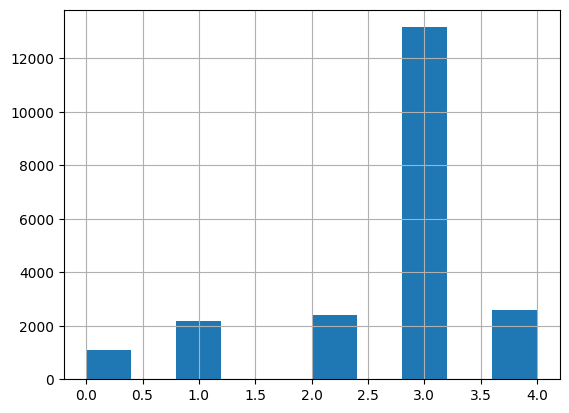

In [4]:
data['label'].hist()

In [5]:
work_dir = '../input/cassava-leaf-disease-classification/'
os.listdir(work_dir)
train_path = '/kaggle/input/cassava-leaf-disease-classification/train_images'

In [6]:
training_df = pd.read_csv(work_dir+"train.csv")
training_df.head(10)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
5,1000837476.jpg,3
6,1000910826.jpg,2
7,1001320321.jpg,0
8,1001723730.jpg,4
9,1001742395.jpg,3


In [7]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [8]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [9]:
file = open(work_dir + 'label_num_to_disease_map.json')
real_labels = json.load(file)
real_labels = {int(k):v for k,v in real_labels.items()}

training_df['class name'] = training_df.label.map(real_labels)
print(training_df.head(10))
print(training_df['class name'].unique())

         image_id  label                           class name
0  1000015157.jpg      0       Cassava Bacterial Blight (CBB)
1  1000201771.jpg      3         Cassava Mosaic Disease (CMD)
2   100042118.jpg      1  Cassava Brown Streak Disease (CBSD)
3  1000723321.jpg      1  Cassava Brown Streak Disease (CBSD)
4  1000812911.jpg      3         Cassava Mosaic Disease (CMD)
5  1000837476.jpg      3         Cassava Mosaic Disease (CMD)
6  1000910826.jpg      2           Cassava Green Mottle (CGM)
7  1001320321.jpg      0       Cassava Bacterial Blight (CBB)
8  1001723730.jpg      4                              Healthy
9  1001742395.jpg      3         Cassava Mosaic Disease (CMD)
['Cassava Bacterial Blight (CBB)' 'Cassava Mosaic Disease (CMD)'
 'Cassava Brown Streak Disease (CBSD)' 'Cassava Green Mottle (CGM)'
 'Healthy']


In [10]:
real_labels_list = list(real_labels.values())
real_labels

{0: 'Cassava Bacterial Blight (CBB)',
 1: 'Cassava Brown Streak Disease (CBSD)',
 2: 'Cassava Green Mottle (CGM)',
 3: 'Cassava Mosaic Disease (CMD)',
 4: 'Healthy'}

In [11]:
count_of_classes = training_df['class name'].value_counts()
print(count_of_classes)

class name
Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Cassava Green Mottle (CGM)              2386
Cassava Brown Streak Disease (CBSD)     2189
Cassava Bacterial Blight (CBB)          1087
Name: count, dtype: int64


Counter({3: 13158, 4: 2577, 2: 2386, 1: 2189, 0: 1087})


<Axes: >

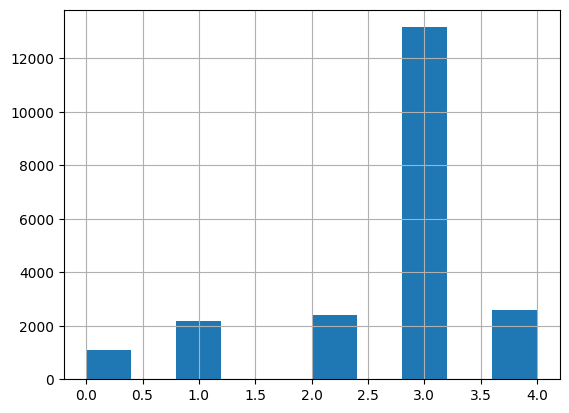

In [12]:
print(Counter(training_df['label']))
training_df['label'].hist()

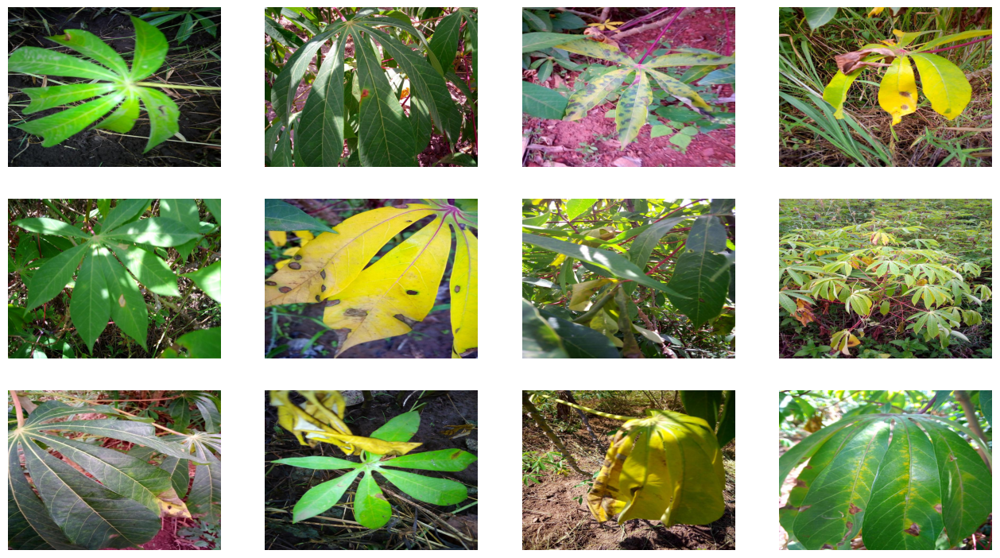

In [13]:
sample = training_df[training_df.label == 0].sample(12) 
plt.figure(figsize=(16,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 4, ind + 1)
    image = cv2.imread(os.path.join(work_dir + "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    
plt.show()

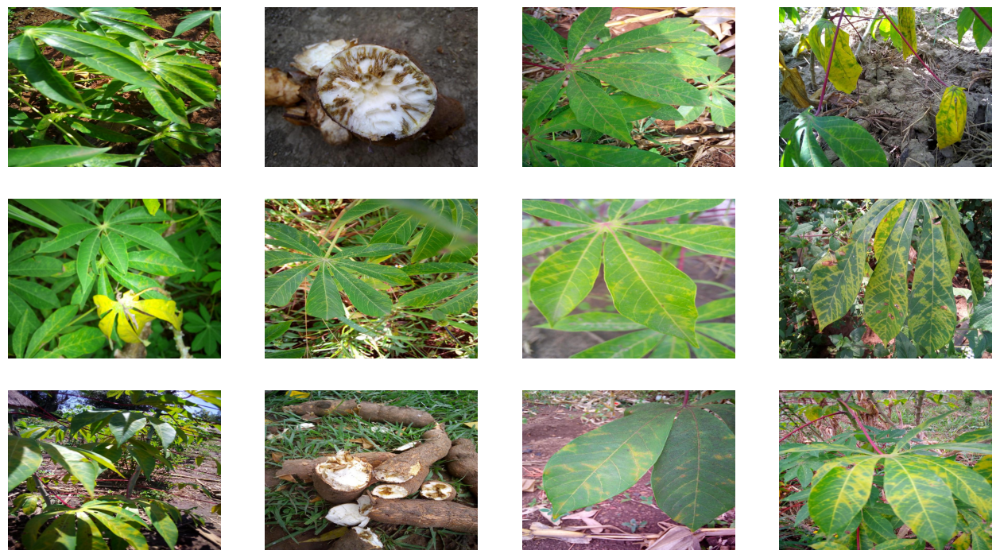

In [14]:
sample = training_df[training_df.label == 1].sample(12) 
plt.figure(figsize=(16,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 4, ind + 1)
    image = cv2.imread(os.path.join(work_dir + "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    
plt.show()

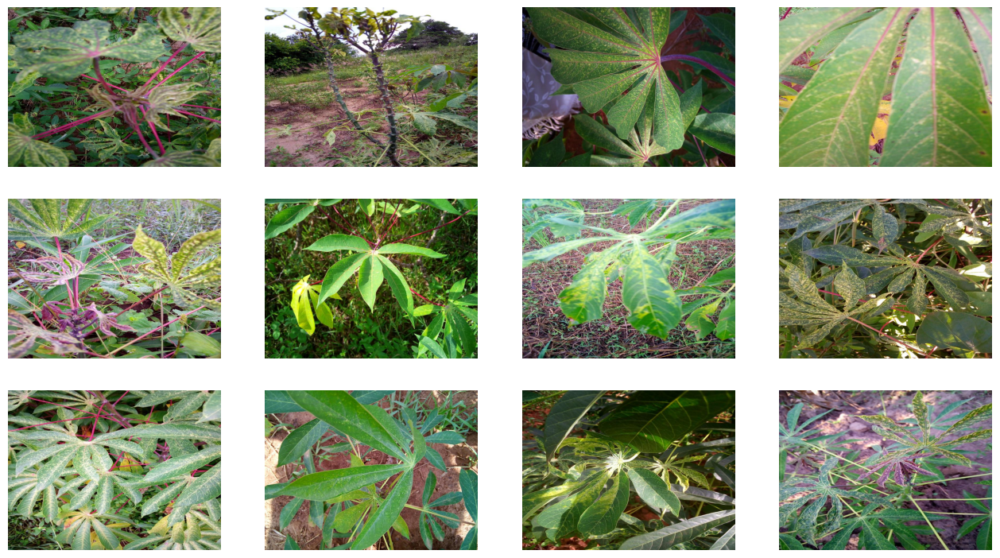

In [15]:
sample = training_df[training_df.label == 2].sample(12) 
plt.figure(figsize=(16,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 4, ind + 1)
    image = cv2.imread(os.path.join(work_dir + "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    
plt.show()

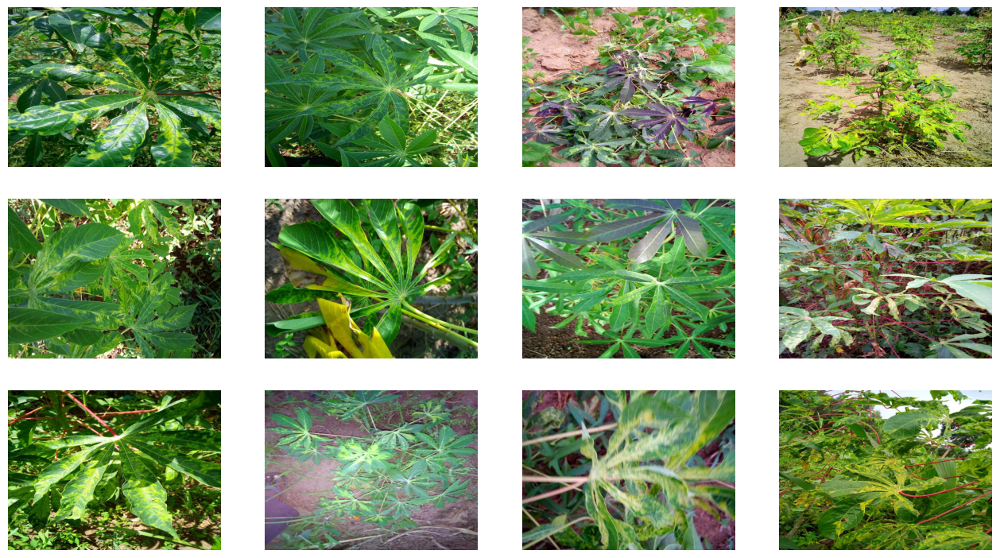

In [16]:
sample = training_df[training_df.label == 3].sample(12)
plt.figure(figsize=(16,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 4, ind + 1)
    image = cv2.imread(os.path.join(work_dir + "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    
plt.show()

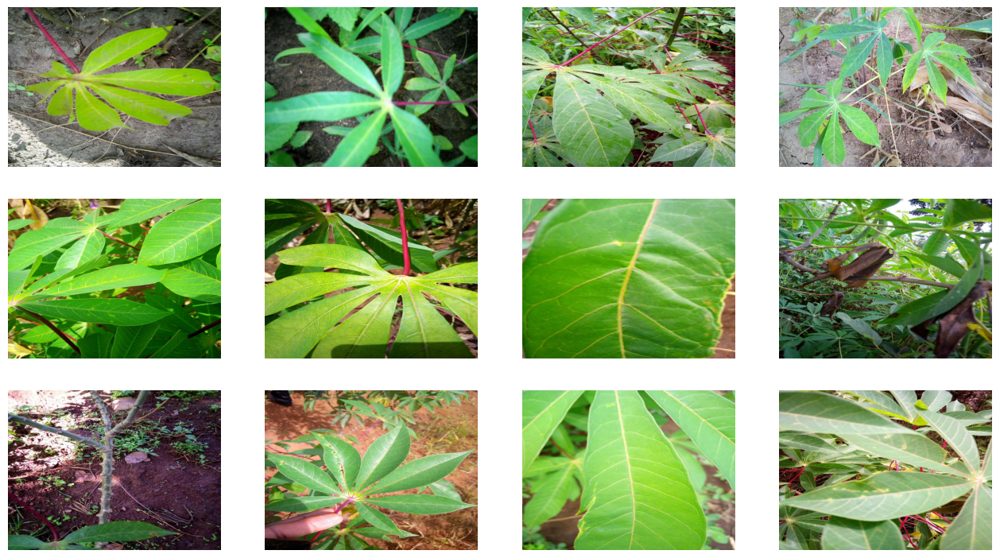

In [17]:
sample = training_df[training_df.label == 4].sample(12)
plt.figure(figsize=(16,12))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(4, 4, ind + 1)
    image = cv2.imread(os.path.join(work_dir + "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    
plt.show()

In [18]:
df_new  = training_df

In [19]:
img_size = (64, 64)
def load_and_preprocess_image(img_path):
    img = load_img(img_path, target_size = img_size)
    img_array = img_to_array(img)
    img_array = img_array / 255.0 
    return img_array
X = []
y = []
for idx, row in training_df.iterrows():
    img_path = os.path.join(work_dir, 'train_images', row['image_id'])
    img_array = load_and_preprocess_image(img_path)
    X.append(img_array)
    y.append(row['label'])
X = np.array(X)
y = np.array(y)
X = X.reshape(X.shape[0], -1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [20]:
model = LogisticRegression(n_jobs = -1,max_iter = 150)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Classification Report:')
print(report)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.5018691588785047
Classification Report:
              precision    recall  f1-score   support

           0       0.18      0.10      0.13       217
           1       0.21      0.15      0.17       438
           2       0.17      0.14      0.15       477
           3       0.64      0.73      0.68      2632
           4       0.15      0.13      0.14       516

    accuracy                           0.50      4280
   macro avg       0.27      0.25      0.25      4280
weighted avg       0.46      0.50      0.48      4280



In [21]:
Batch_size = 64
img_height, img_width = 256, 256
training_df['label'] = training_df['label'].astype('str') 

In [22]:
train_gen = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    validation_split = 0.2,
)

train_datagen = train_gen.flow_from_dataframe(
    training_df,
    directory = os.path.join(work_dir, "train_images"),
    batch_size = Batch_size,
    target_size = (img_height, img_width),
    subset = "training",
    seed = 42,
    x_col = "image_id",
    y_col = "label",
    class_mode = "categorical"
)

val_gen = ImageDataGenerator(
    validation_split = 0.2
)

val_datagen = val_gen.flow_from_dataframe(
    training_df,
    directory = os.path.join(work_dir, "train_images"),
    batch_size = Batch_size,
    target_size = (img_height, img_width),
    subset = "validation",
    seed = 42,
    x_col = "image_id",
    y_col = "label",
    class_mode = "categorical"
)

Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


In [23]:
len(train_datagen),len(val_datagen)

(268, 67)

In [24]:
img, label = next(train_datagen)

Steps_per_train = float(train_datagen.n) / train_datagen.batch_size
Steps_per_val = float(val_datagen.n) / val_datagen.batch_size

Steps_per_train, Steps_per_val

(267.46875, 66.859375)

In [25]:
def create_model():
    model = models.Sequential()
    model.add(EfficientNetB3(include_top=False, weights='imagenet',
                             input_shape=(img_height, img_width, 3), drop_connect_rate=0.3))
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(5, activation='softmax'))
    
    loss = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.0001,
        name='categorical_crossentropy'
    )
    optimizer = optimizers.Adam(learning_rate=1e-4)
    
    model.compile(optimizer=optimizer,
                  loss=loss,
                  metrics=["categorical_accuracy"])
    return model

model = create_model()
model.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ ?                      │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,783,535 (41.14 MB)

 Trainable params: 10,696,232 (40.80 MB)

 Non-trainable params: 87,303 (341.03 KB)

In [26]:
model.build((None))
print('Our EfficientNet CNN has %d layers' %len(model.layers))

Our EfficientNet CNN has 6 layers


In [27]:
rlronp=tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                            factor=0.2,
                                            mode = "min",
                                            min_lr=1e-6,
                                            patience=2, 
                                            verbose=1)

estop=tf.keras.callbacks.EarlyStopping(monitor="val_loss", 
                                       mode= "min",
                                       patience=3, 
                                       verbose=1,
                                       restore_best_weights=True)

history = model.fit(
    train_datagen,
    steps_per_epoch=int(Steps_per_train),
    epochs=5,
    verbose =1,
    validation_data=val_datagen,
    validation_steps=int(Steps_per_val),
    callbacks=[rlronp, estop]
)

Epoch 1/5


2024-07-28 04:31:48.486935: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng3{k11=2} for conv (f32[64,144,129,129]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,144,131,131]{3,2,1,0}, f32[144,1,3,3]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, feature_group_count=144, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-07-28 04:31:49.357829: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.870996783s
Trying algorithm eng3{k11=2} for conv (f32[64,144,129,129]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,144,131,131]{3,2,1,0}, f32[144,1,3,3]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, feature_group_count=144, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-07-28 04

 74/267 ━━━━━━━━━━━━━━━━━━━━ 1:53 588ms/step - categorical_accuracy: 0.5689 - loss: 1.1542

W0000 00:00:1722141344.949741      93 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.6585 - loss: 0.9343

W0000 00:00:1722141466.925557      92 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


267/267 ━━━━━━━━━━━━━━━━━━━━ 498s 1s/step - categorical_accuracy: 0.6587 - loss: 0.9336 - val_categorical_accuracy: 0.8018 - val_loss: 0.5620 - learning_rate: 1.0000e-04
Epoch 2/5
267/267 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - categorical_accuracy: 0.8594 - loss: 0.4172 - val_categorical_accuracy: 0.6727 - val_loss: 0.8171 - learning_rate: 1.0000e-04
Epoch 3/5


W0000 00:00:1722141511.464446      93 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


267/267 ━━━━━━━━━━━━━━━━━━━━ 181s 668ms/step - categorical_accuracy: 0.8181 - loss: 0.5157 - val_categorical_accuracy: 0.8319 - val_loss: 0.4855 - learning_rate: 1.0000e-04
Epoch 4/5
267/267 ━━━━━━━━━━━━━━━━━━━━ 1s 637us/step - categorical_accuracy: 0.7969 - loss: 0.5107 - val_categorical_accuracy: 0.8000 - val_loss: 0.8919 - learning_rate: 1.0000e-04
Epoch 5/5
267/267 ━━━━━━━━━━━━━━━━━━━━ 182s 670ms/step - categorical_accuracy: 0.8596 - loss: 0.4095 - val_categorical_accuracy: 0.8288 - val_loss: 0.4843 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 5.


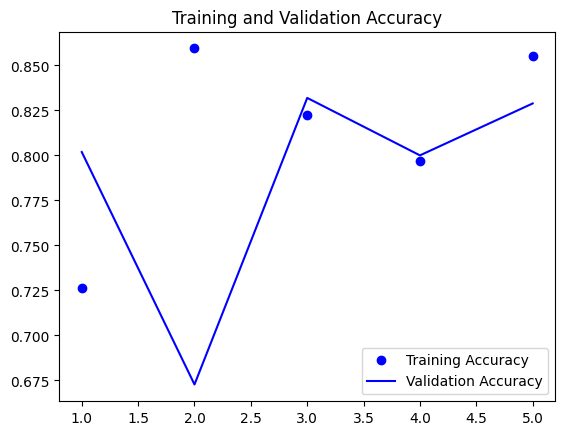

In [28]:
train_acc = history.history["categorical_accuracy"]
val_acc = history.history["val_categorical_accuracy"]
epochs = range(1, len(train_acc)+1)
plt.plot(epochs, train_acc, "bo", label = "Training Accuracy")
plt.plot(epochs, val_acc, "b", label = "Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

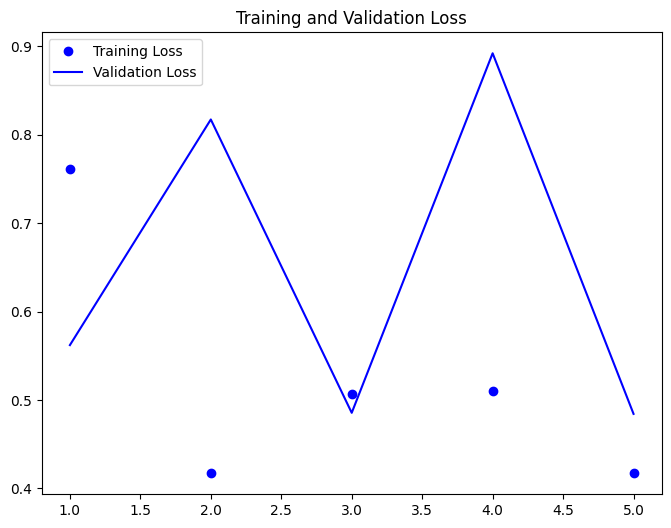

In [29]:
plt.figure(figsize=(8,6))
train_loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(train_loss)+1)
plt.plot(epochs, train_loss, "bo", label = "Training Loss")
plt.plot(epochs, val_loss, "b", label = "Validation Loss")
plt.title("Training and Validation Loss")
plt.legend()